In [1]:
# Importing libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import plotly.express as px
sns.set_style("darkgrid")
from scipy import stats
from scipy.stats import boxcox,yeojohnson
%matplotlib inline

In [2]:
df = pd.read_csv(r'C:\Users\Acer\Desktop\Data Samples\london_merged.csv')

In [3]:
df.head()

,timestamp,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0
2,2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0
3,2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0
4,2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0


In [4]:
df.shape

(17414, 10)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17414 entries, 0 to 17413
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   timestamp     17414 non-null  object 
 1   cnt           17414 non-null  int64  
 2   t1            17414 non-null  float64
 3   t2            17414 non-null  float64
 4   hum           17414 non-null  float64
 5   wind_speed    17414 non-null  float64
 6   weather_code  17414 non-null  float64
 7   is_holiday    17414 non-null  float64
 8   is_weekend    17414 non-null  float64
 9   season        17414 non-null  float64
dtypes: float64(8), int64(1), object(1)
memory usage: 1.3+ MB


In [6]:
# Setting timestamp column to date time format

df['timestamp'] = pd.to_datetime(df['timestamp'])

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
cnt,17414.0,1143.101642,1085.108068,0.0,257.0,844.0,1671.75,7860.0
t1,17414.0,12.468091,5.571818,-1.5,8.0,12.5,16.00,34.0
t2,17414.0,11.520836,6.615145,-6.0,6.0,12.5,16.00,34.0
hum,17414.0,72.324954,14.313186,20.5,63.0,74.5,83.00,100.0
wind_speed,17414.0,15.913063,7.894570,0.0,10.0,15.0,20.50,56.5
weather_code,17414.0,2.722752,2.341163,1.0,1.0,2.0,3.00,26.0
is_holiday,17414.0,0.022051,0.146854,0.0,0.0,0.0,0.00,1.0
is_weekend,17414.0,0.285403,0.451619,0.0,0.0,0.0,1.00,1.0
season,17414.0,1.492075,1.118911,0.0,0.0,1.0,2.00,3.0


In [8]:
df.isnull().sum()

timestamp       0
cnt             0
t1              0
t2              0
hum             0
wind_speed      0
weather_code    0
is_holiday      0
is_weekend      0
season          0
dtype: int64

In [9]:
df.nunique()

timestamp       17414
cnt              3781
t1                 73
t2                 82
hum               143
wind_speed        103
weather_code        7
is_holiday          2
is_weekend          2
season              4
dtype: int64

In [10]:
# Determine the correlation of two temperatures

df['t1'].corr(df['t2'])

0.9883442218765803

In [11]:
df['year'] = df['timestamp'].dt.year
df['month'] = df['timestamp'].dt.month
df['day'] = df['timestamp'].dt.day

df.head()

,timestamp,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season,year,month,day
0,2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0,2015,1,4
1,2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0,2015,1,4
2,2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0,2015,1,4
3,2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0,2015,1,4
4,2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0,2015,1,4


In [12]:
df['weather_code'].unique()
#1 = Clear ; mostly clear but have some values with haze/fog/patches of fog/ fog in vicinity
#2 = scattered clouds / few clouds
#3 = Broken clouds
#4 = Cloudly
#7 = Rain/ light Rain shower/ Light rain
#10 = rain with thunderstorm
#26 = snowfall
#94 = Freezing Fog

array([ 3.,  1.,  4.,  7.,  2., 26., 10.])

In [13]:
df['weather_code'].value_counts()

1.0     6150
2.0     4034
3.0     3551
7.0     2141
4.0     1464
26.0      60
10.0      14
Name: weather_code, dtype: int64

In [14]:
# Dropping weather code 10 and 26 due to few records

df = df[(df['weather_code']!=10) & (df['weather_code']!=26)]

In [15]:
df['season'].value_counts()

1.0    4382
0.0    4381
2.0    4292
3.0    4285
Name: season, dtype: int64

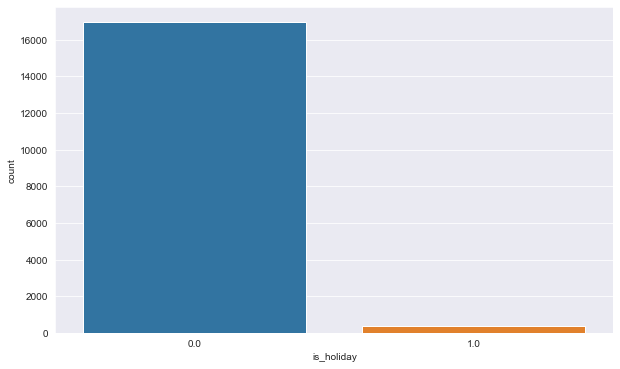

In [16]:
plt.figure(figsize=(10,6))
sns.countplot(x = "is_holiday", data = df);

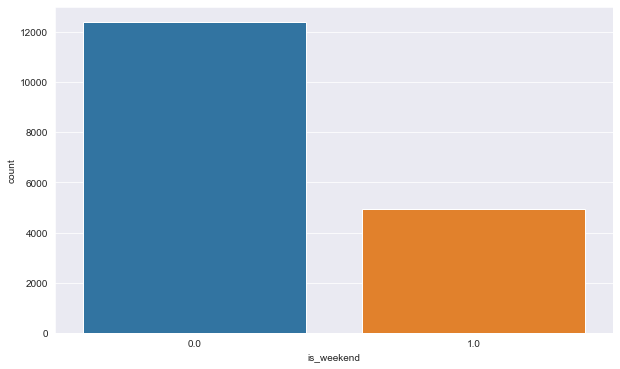

In [17]:
plt.figure(figsize=(10,6))
sns.countplot(x = "is_weekend", data = df);

In [18]:
df1 = df.copy()

In [19]:
df1.set_index('timestamp', inplace=True)

In [20]:
from datetime import datetime

df1["year_month"] = df1.index.strftime('%Y-%m')
df1["year"] = df1.index.year
df1["month"] = df1.index.month
df1["day_of_week"] = df1.index.day_of_week
df1["hour"] = df1.index.hour

df1.head()

,cnt,t1,t2,hum,wind_speed,weather_code,is_holiday,is_weekend,season,year,month,day,year_month,day_of_week,hour
timestamp,,,,,,,,,,,,,,,
2015-01-04 00:00:00,182,3.0,2.0,93.0,6.0,3.0,0.0,1.0,3.0,2015,1,4,2015-01,6,0
2015-01-04 01:00:00,138,3.0,2.5,93.0,5.0,1.0,0.0,1.0,3.0,2015,1,4,2015-01,6,1
2015-01-04 02:00:00,134,2.5,2.5,96.5,0.0,1.0,0.0,1.0,3.0,2015,1,4,2015-01,6,2
2015-01-04 03:00:00,72,2.0,2.0,100.0,0.0,1.0,0.0,1.0,3.0,2015,1,4,2015-01,6,3
2015-01-04 04:00:00,47,2.0,0.0,93.0,6.5,1.0,0.0,1.0,3.0,2015,1,4,2015-01,6,4


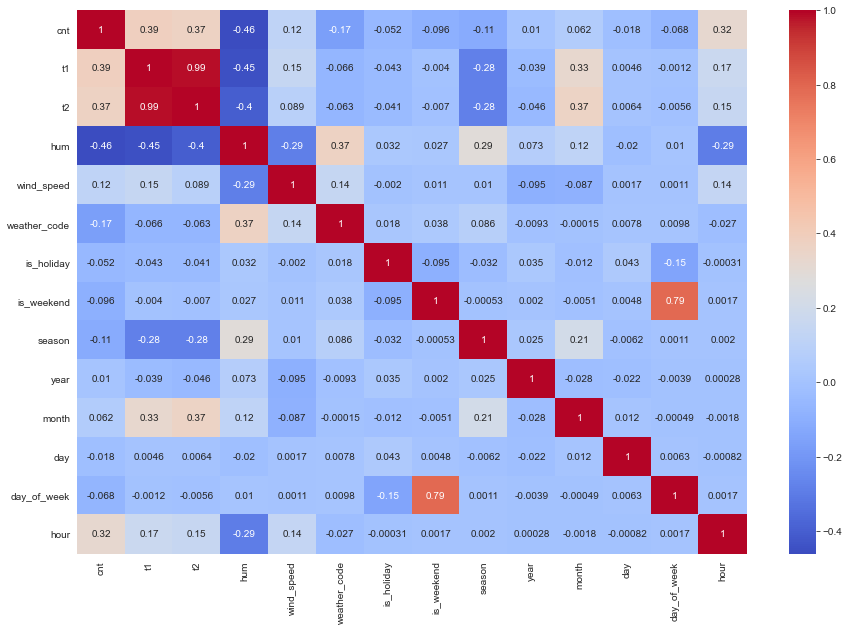

In [21]:
# heatmap for all variables

plt.figure(figsize=(15,10))
sns.heatmap(df1.corr(), annot = True, cmap = 'coolwarm');

In [22]:
df1_corr = df1.drop("year_month", axis = 1)

In [23]:
targetvariable = round(df1_corr.corr().iloc[0].sort_values(ascending=False), 3)
targetvariable

cnt             1.000
t1              0.388
t2              0.368
hour            0.324
wind_speed      0.118
month           0.062
year            0.010
day            -0.018
is_holiday     -0.052
day_of_week    -0.068
is_weekend     -0.096
season         -0.114
weather_code   -0.170
hum            -0.461
Name: cnt, dtype: float64

In [24]:
targetvariable.index

Index(['cnt', 't1', 't2', 'hour', 'wind_speed', 'month', 'year', 'day',
       'is_holiday', 'day_of_week', 'is_weekend', 'season', 'weather_code',
       'hum'],
      dtype='object')

In [25]:
targetvariable.values

array([ 1.   ,  0.388,  0.368,  0.324,  0.118,  0.062,  0.01 , -0.018,
       -0.052, -0.068, -0.096, -0.114, -0.17 , -0.461])

In [26]:
targetvariable_df = pd.DataFrame({'Cnt': [ 1.   ,  0.388,  0.368,  0.324,  0.118,  0.062,  0.01 , -0.018,
       -0.052, -0.068, -0.096, -0.114, -0.17 , -0.461]}, index=['cnt', 't1', 't2', 'hour', 'wind_speed', 'month', 'year',
       'day_of_month', 'is_holiday', 'day_of_week', 'is_weekend', 'season',
       'weather_code', 'hum'])

In [27]:
targetvariable_df

,Cnt
cnt,1.000
t1,0.388
t2,0.368
hour,0.324
wind_speed,0.118
month,0.062
year,0.010
day_of_month,-0.018
is_holiday,-0.052
day_of_week,-0.068


<AxesSubplot:>

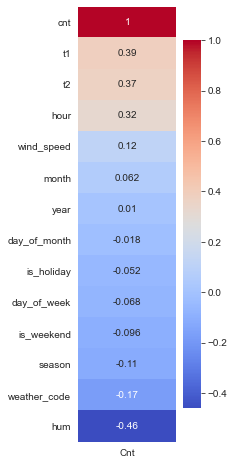

In [28]:
plt.figure(figsize=(2.2,8))
sns.heatmap(targetvariable_df, annot=True, cmap='coolwarm')

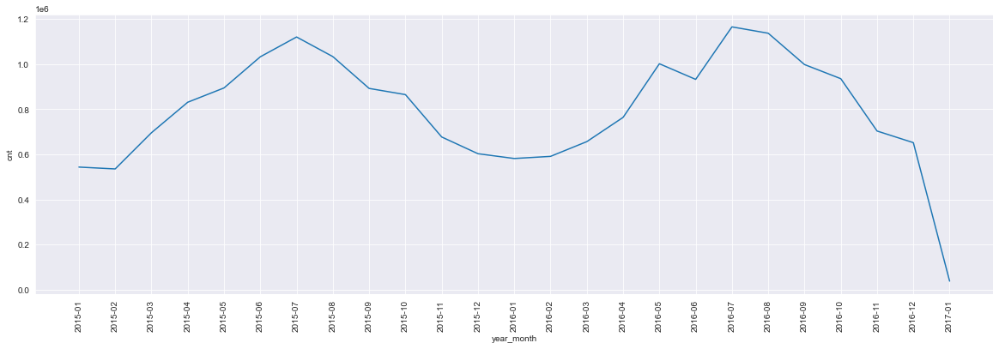

In [29]:
plt.figure(figsize=(20,6))
sns.lineplot(data=df1, x='year_month', y='cnt', estimator='sum', ci=None)
plt.xticks(rotation=90);

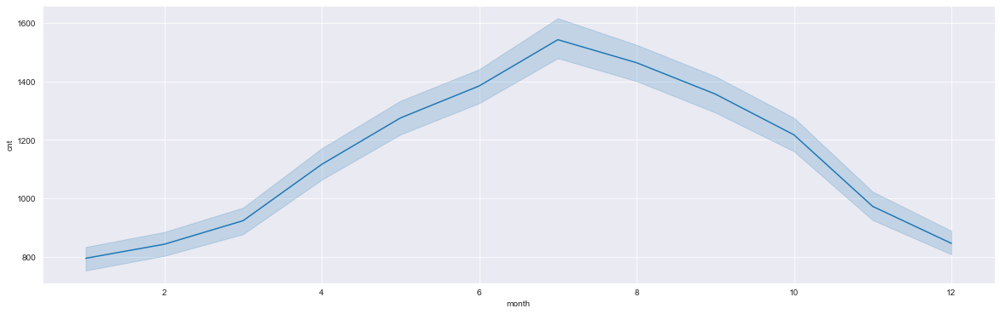

In [30]:
plt.figure(figsize=(20,6))
sns.lineplot(data = df1, x = 'month', y = 'cnt');

In [31]:
df2 = df.pivot_table(values='cnt', index='day', columns='month').fillna(0)
df2.head()

month,1,2,3,4,5,6,7,8,9,10,11,12
day,,,,,,,,,,,,
1,342.723404,751.782609,757.187500,1074.446809,1225.583333,1140.312500,1466.062500,1515.958333,1379.276596,1086.562500,1143.791667,1100.083333
2,396.208333,961.541667,893.604167,980.187500,867.895833,1184.166667,1428.833333,1497.666667,1257.500000,1302.604167,1251.479167,1120.416667
3,506.354167,987.790698,1005.437500,771.500000,1106.812500,1346.479167,1526.645833,1576.458333,1283.750000,1344.541667,1283.354167,912.437500
4,620.145833,979.250000,1030.127660,807.936170,1312.020833,1440.583333,1573.000000,1598.458333,1192.104167,1389.395833,945.708333,858.812500
5,899.520833,876.068182,773.145833,1040.500000,1357.750000,1689.068182,1462.062500,1590.659574,1045.625000,1181.958333,915.062500,890.458333


In [32]:
df2 = df1.pivot_table(values='cnt', index='day_of_week', columns='month').fillna(0)
df2.head()

month,1,2,3,4,5,6,7,8,9,10,11,12
day_of_week,,,,,,,,,,,,
0,861.553488,933.635922,916.689815,1132.921875,1203.925926,1321.050926,1478.829787,1301.648536,1298.614583,1268.236111,1003.004651,874.651042
1,938.148148,1011.908602,1021.207627,1323.322751,1231.604651,1458.953488,1606.390625,1510.257009,1368.138889,1336.795699,1152.708920,896.115741
2,966.962766,962.661458,1039.411215,1246.530233,1289.369792,1455.689815,1618.981481,1534.657407,1453.504630,1239.421875,1149.615385,951.435185
3,915.647059,925.691489,1018.620370,1201.279070,1375.619792,1467.958333,1761.238318,1608.221053,1500.786047,1336.115741,1124.531250,899.725000
4,844.136150,913.371728,1024.701571,1031.070423,1360.810185,1509.589595,1442.191667,1430.246073,1363.322751,1307.851163,1061.151042,956.800926


In [33]:
day_name = ['Sun', 'Mon', 'Tues', 'Wed', 'Thurs', 'Fri', 'Sat']
df2['day_name'] = day_name
df2.set_index(keys='day_name', inplace=True)
df2.columns = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June', 'July', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

df2.head()

,Jan,Feb,Mar,Apr,May,June,July,Aug,Sep,Oct,Nov,Dec
day_name,,,,,,,,,,,,
Sun,861.553488,933.635922,916.689815,1132.921875,1203.925926,1321.050926,1478.829787,1301.648536,1298.614583,1268.236111,1003.004651,874.651042
Mon,938.148148,1011.908602,1021.207627,1323.322751,1231.604651,1458.953488,1606.390625,1510.257009,1368.138889,1336.795699,1152.708920,896.115741
Tues,966.962766,962.661458,1039.411215,1246.530233,1289.369792,1455.689815,1618.981481,1534.657407,1453.504630,1239.421875,1149.615385,951.435185
Wed,915.647059,925.691489,1018.620370,1201.279070,1375.619792,1467.958333,1761.238318,1608.221053,1500.786047,1336.115741,1124.531250,899.725000
Thurs,844.136150,913.371728,1024.701571,1031.070423,1360.810185,1509.589595,1442.191667,1430.246073,1363.322751,1307.851163,1061.151042,956.800926


<AxesSubplot:ylabel='day_name'>

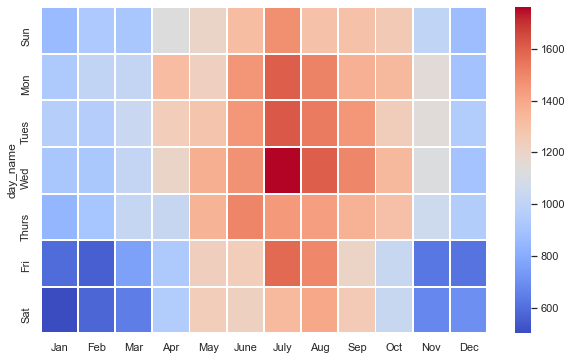

In [34]:
sns.set(rc = {'figure.figsize':(10,6)})
sns.heatmap(df2,cmap='coolwarm',linecolor='white',linewidths=1)

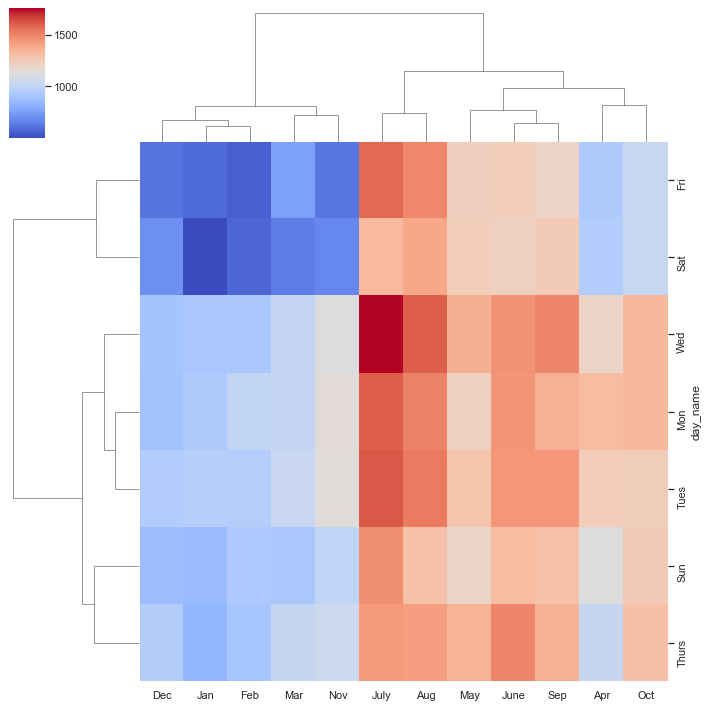

In [35]:
sns.clustermap(df2, cmap='coolwarm')

<AxesSubplot:xlabel='month', ylabel='cnt'>

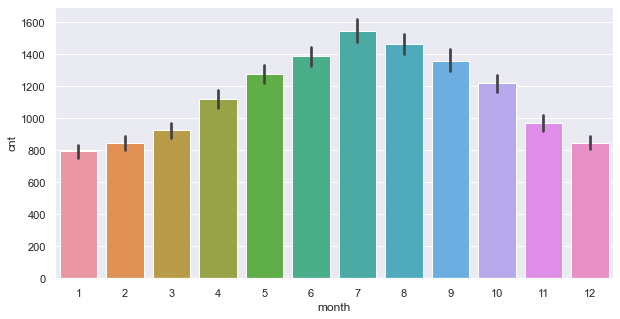

In [36]:
plt.figure(figsize=(10,5))
sns.barplot(x='month', y='cnt', data=df)

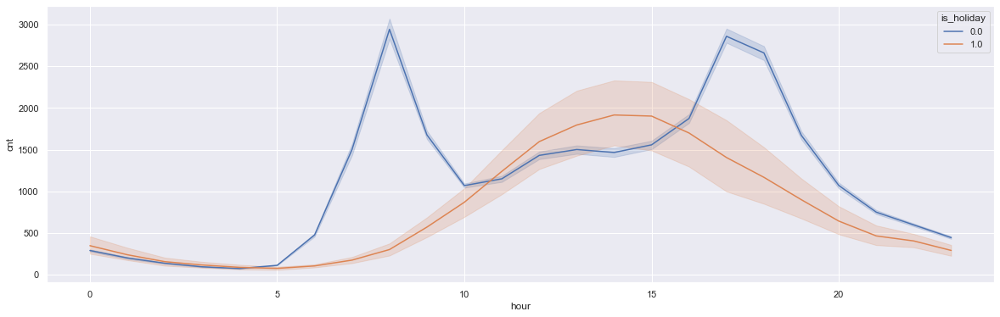

In [37]:
plt.figure(figsize=(20,6))
sns.lineplot(data = df1, x = 'hour', y = 'cnt', hue = 'is_holiday');

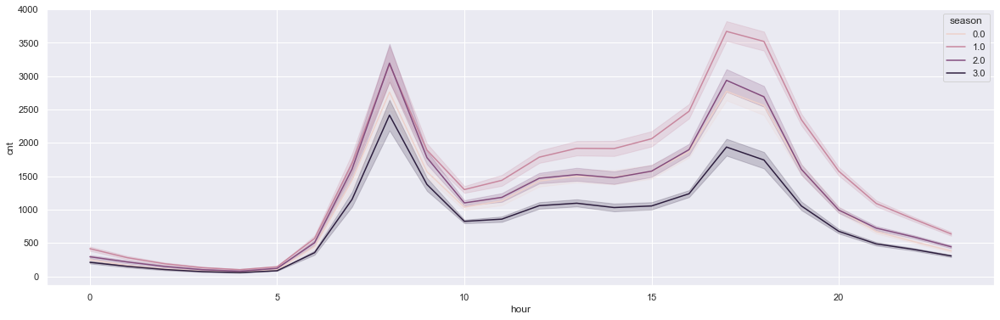

In [38]:
plt.figure(figsize=(20,6))
sns.lineplot(data = df1, x = 'hour', y = 'cnt', hue = 'season');

<AxesSubplot:xlabel='hour', ylabel='cnt'>

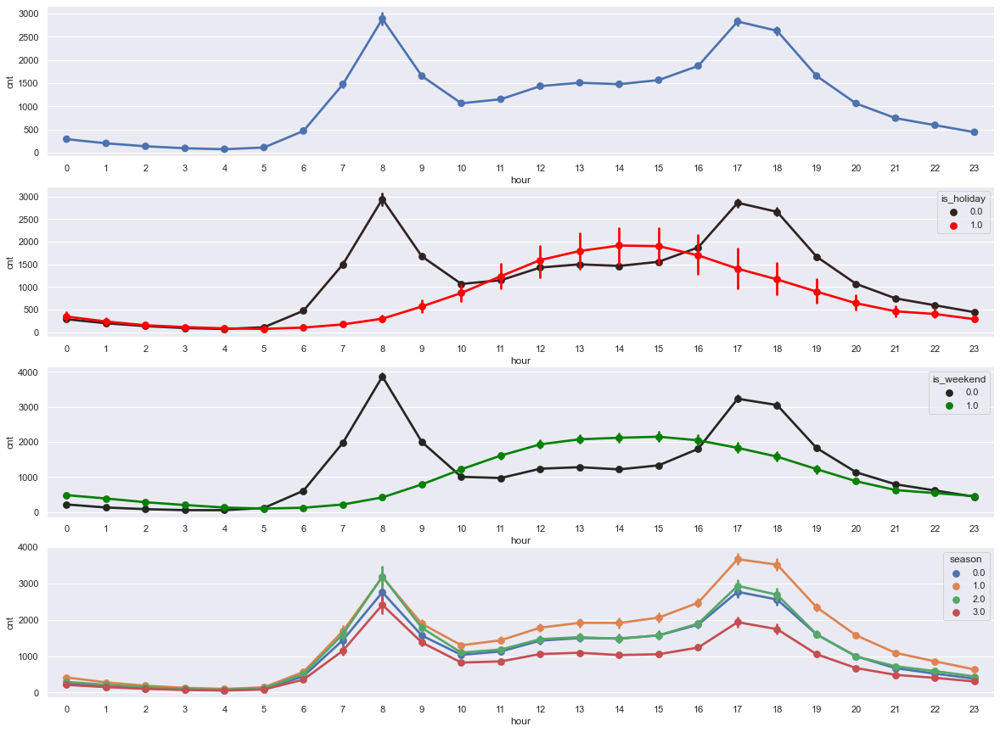

In [39]:
fig, ax = plt.subplots(nrows=4, figsize=(20,15))

sns.pointplot(data=df1, x='hour', y='cnt', ax=ax[0])
sns.pointplot(data=df1, x='hour', y='cnt', hue='is_holiday', ax=ax[1], color='red')
sns.pointplot(data=df1, x='hour', y='cnt', hue='is_weekend', ax=ax[2], color='green')
sns.pointplot(data=df1, x='hour', y='cnt', hue='season', ax=ax[3])

<AxesSubplot:xlabel='day_of_week', ylabel='cnt'>

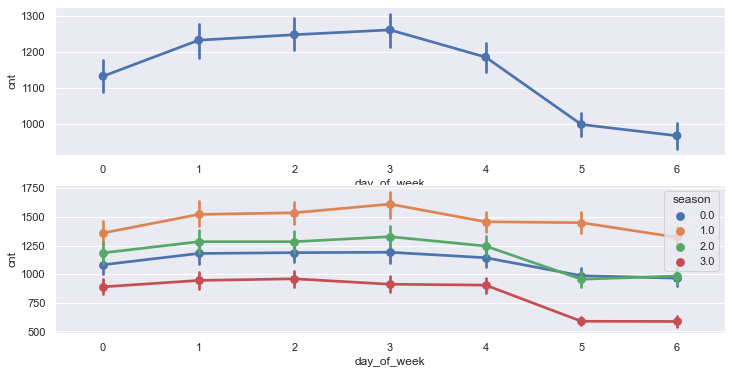

In [40]:
fig, ax = plt.subplots(nrows=2, figsize=(12,6))

sns.pointplot(data=df1, x='day_of_week', y='cnt', ax=ax[0])
sns.pointplot(data=df1, x='day_of_week', y='cnt', hue='season', ax=ax[1])

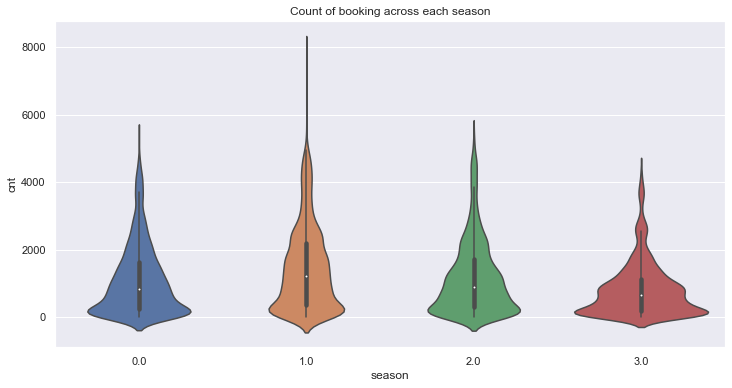

In [41]:
plt.figure(figsize=(12,6))
sns.violinplot(y='cnt',x='season',data=df)
plt.title('Count of booking across each season')
plt.show()

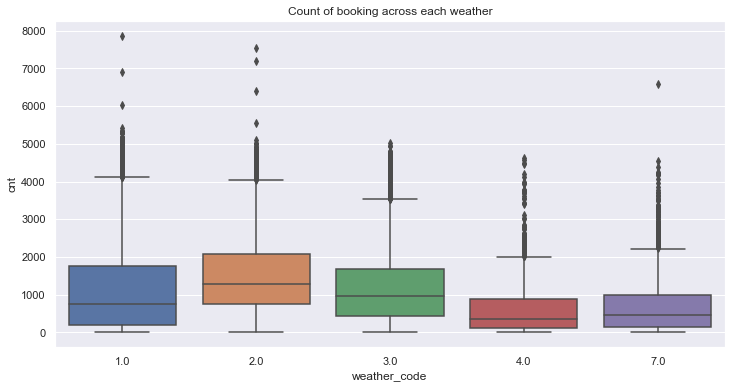

In [42]:
plt.figure(figsize=(12,6))
sns.boxplot(y='cnt',x='weather_code',data=df)
plt.title('Count of booking across each weather')
plt.show()

In [43]:
df['is_weekend'].value_counts()

0.0    12399
1.0     4941
Name: is_weekend, dtype: int64

In [44]:
index = ['Weekday', 'Weekend']
index

['Weekday', 'Weekend']

In [45]:
values = [12399, 4941]
values

[12399, 4941]

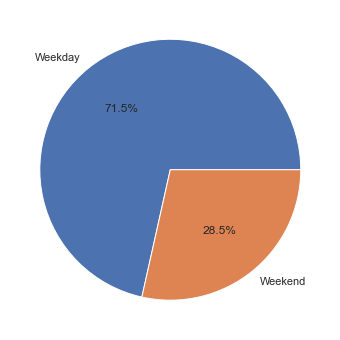

In [46]:
# Using pie chart to visualize the distribution of bike shares by weekday/weekend with piechart and barplot

plt.figure(figsize=(12,6))
plt.pie(x=values, labels=index, labeldistance=1.1, autopct='%1.1f%%')
plt.show()

In [47]:
oran = df.is_weekend.value_counts().sum()/100

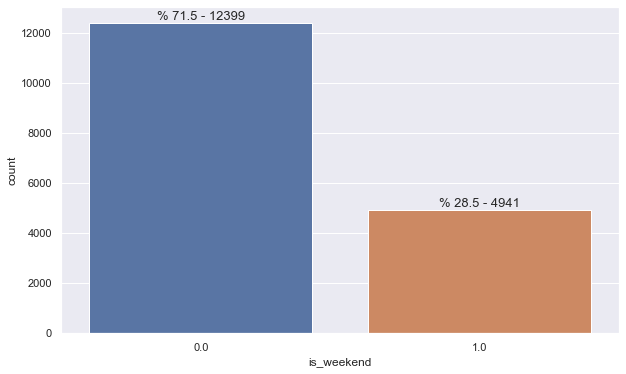

In [48]:
plt.figure(figsize=(10,6))
sns.countplot(data = df, x = 'is_weekend')
for index, value in enumerate(df.is_weekend.value_counts()):
    plt.text(index, value, f"% {value/oran:.3} - {value}", ha='center', va='bottom', fontsize = 13)

<AxesSubplot:xlabel='weather_code', ylabel='count'>

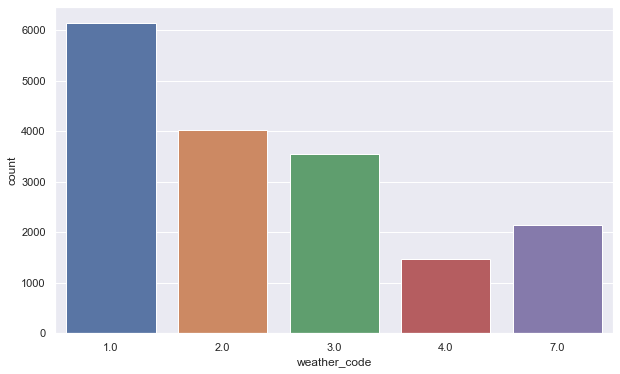

In [49]:
sns.countplot(x='weather_code', data=df)

<Figure size 720x432 with 0 Axes>

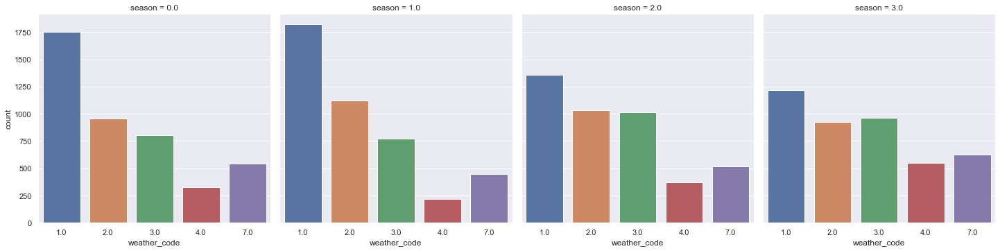

In [50]:
plt.figure(figsize=(10,6))
sns.catplot(x='weather_code', col='season', col_wrap=4, data=df, kind='count')

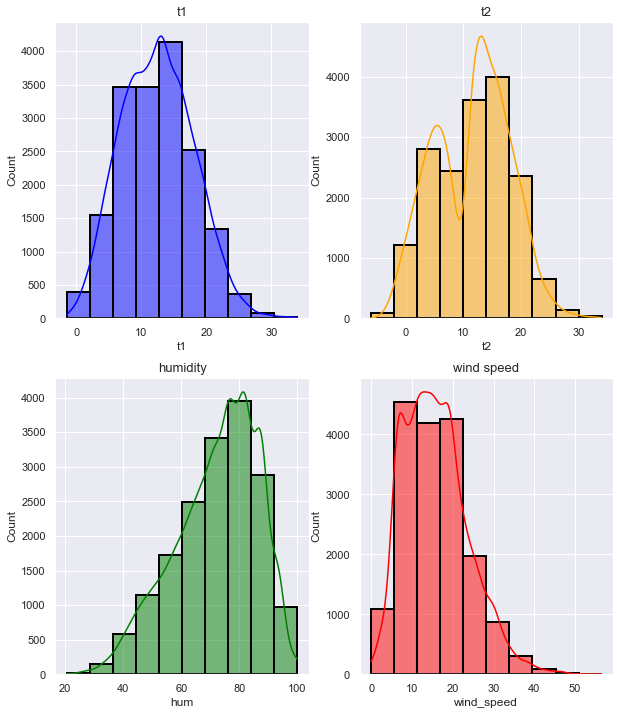

In [51]:
# Visualize all the continous variables with histogram and scatterplot

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10,12))
sns.histplot(data=df, x='t1', kde=True, bins=10, ax=axes[0][0], color='blue', edgecolor = "black", linewidth = 2)
sns.histplot(data=df, x='t2', kde=True, bins=10, ax=axes[0][1], color='orange', edgecolor = "black", linewidth = 2)
sns.histplot(data=df, x='hum', kde=True, bins=10, ax=axes[1][0], color='green', edgecolor = "black", linewidth = 2)
sns.histplot(data=df, x='wind_speed', kde=True, bins=10, ax=axes[1][1], color='red', edgecolor = "black", linewidth = 2)

axes[0][0].set_title("t1", fontsize = 13)
axes[0][1].set_title("t2", fontsize = 13)
axes[1][0].set_title("humidity", fontsize = 13)
axes[1][1].set_title("wind speed", fontsize = 13);

In [52]:
# Using plotly to record count of new bike shares

fig = px.histogram(df, x= 'cnt', title='Count of a New Bike Shares', marginal="box", hover_data = df[['season']])
fig.show()

In [53]:
fig = px.histogram(df, x= 't1', title='Temperatures', marginal="box", hover_data = df[['season']])
fig.show()

In [54]:
fig = px.histogram(df, x= 'wind_speed', title='Wind Speed', marginal="box", hover_data = df[['season']])
fig.show()

In [55]:
fig = px.histogram(df, x= 'hum', title='Humidity', marginal="box", hover_data = df[['season']])
fig.show()

In [56]:
# Bike shares per hour using plotly scatter

fig = px.scatter(df1, x='hour', y='cnt', color='is_holiday')
fig.show()

In [57]:
fig = px.scatter(df1, x='hour', y='cnt', color='is_weekend')
fig.show()

In [58]:
fig = px.scatter(df1, x='day_of_week', y='cnt', color='is_weekend', hover_data=df1[['hour']])
fig.show()

In [59]:
mon_year_data = df.groupby(['year','month'])['cnt'].sum()
mon_year_data = pd.DataFrame(mon_year_data)
mon_year_data.reset_index(inplace=True)
mon_year_data

,year,month,cnt
0,2015,1,543573
1,2015,2,535332
2,2015,3,695934
3,2015,4,831206
4,2015,5,894639
5,2015,6,1032779
6,2015,7,1120687
7,2015,8,1033556
8,2015,9,892478
9,2015,10,865046


In [60]:
myd = mon_year_data.pivot(index='month', columns='year', values='cnt').fillna(0)
myd.drop(columns=2017, axis=1, inplace=True)
myd

year,2015,2016
month,,
1,543573.0,581590.0
2,535332.0,591038.0
3,695934.0,656455.0
4,831206.0,764030.0
5,894639.0,1001935.0
6,1032779.0,932637.0
7,1120687.0,1165527.0
8,1033556.0,1137314.0
9,892478.0,998377.0


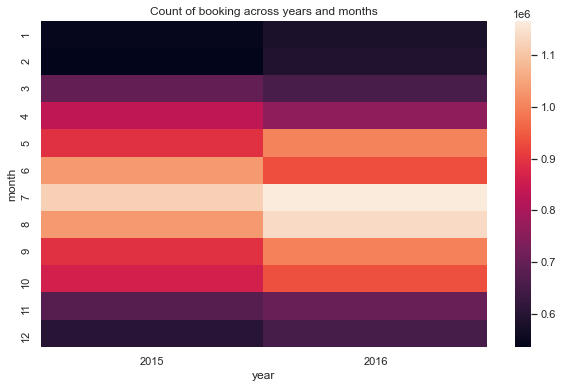

In [61]:
sns.heatmap(myd)
plt.title('Count of booking across years and months')
plt.show()

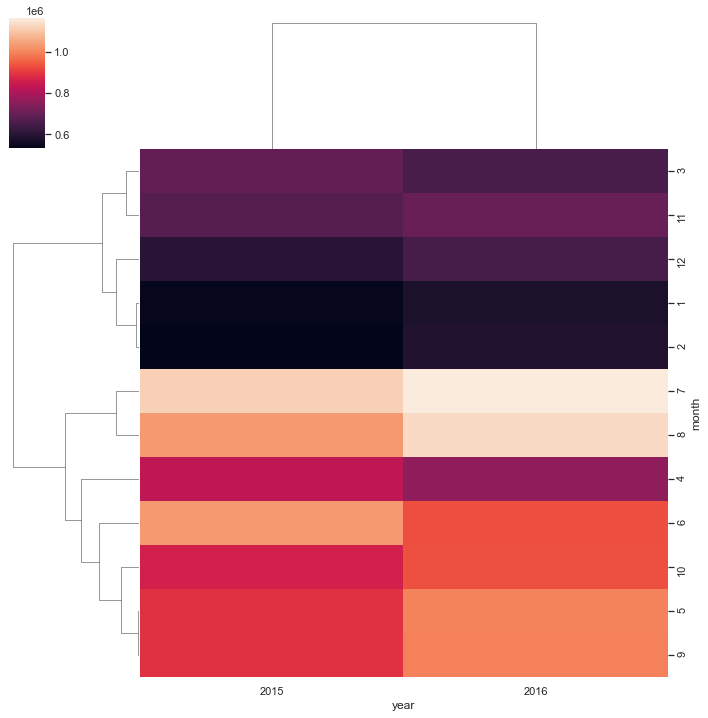

In [62]:
sns.clustermap(myd)


In [63]:
# Setting variables for data frames of working and non-working days

work_day = df[df['is_holiday']==0]
non_workday = df[df['is_holiday']==1]

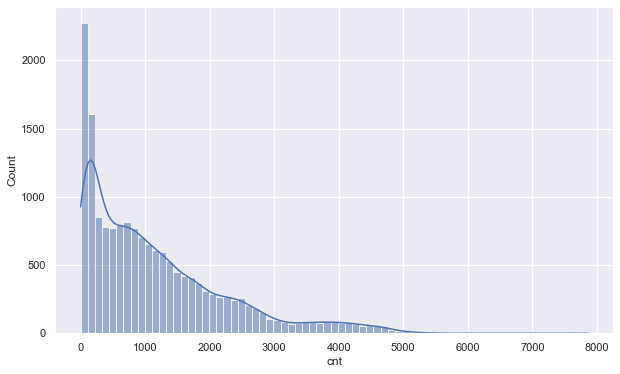

In [65]:
sns.histplot(x='cnt', data=work_day, kde=True)
plt.show()

Text(0.5, 1.0, 'Q-Q plot for working day')

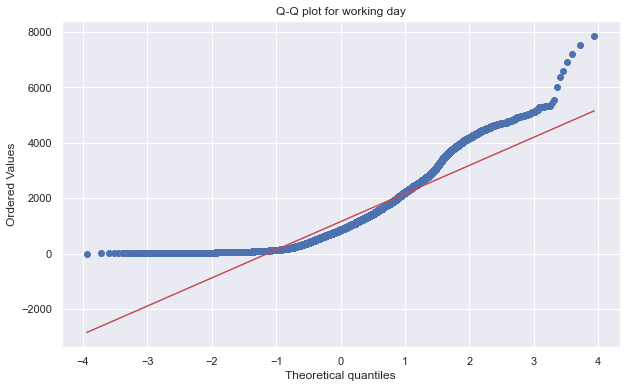

In [67]:
stats.probplot(work_day['cnt'], plot=plt, dist='norm')
plt.title('Q-Q plot for working day')

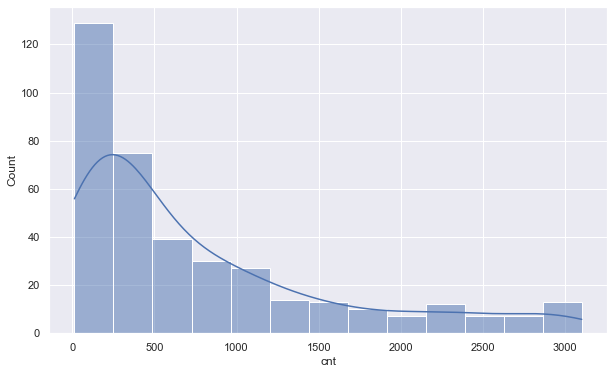

In [68]:
sns.histplot(x='cnt', data=non_workday, kde=True)
plt.show()

Text(0.5, 1.0, 'Q-Q plot for non-working day')

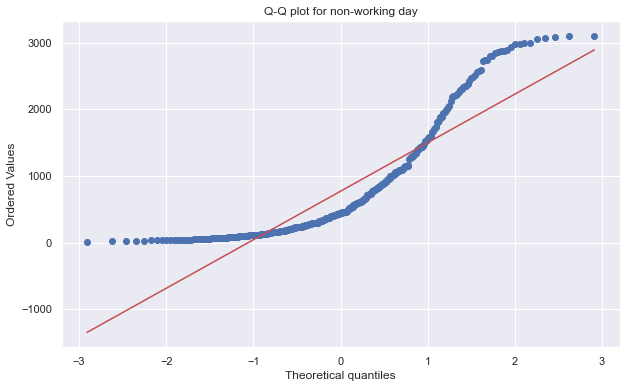

In [69]:
stats.probplot(non_workday['cnt'], plot=plt, dist='norm')
plt.title('Q-Q plot for non-working day')

In [70]:
s1 = df[df['season']==0].sample(4000)
s2 = df[df['season']==1].sample(4000)
s3 = df[df['season']==2].sample(4000)
s4 = df[df['season']==3].sample(4000)

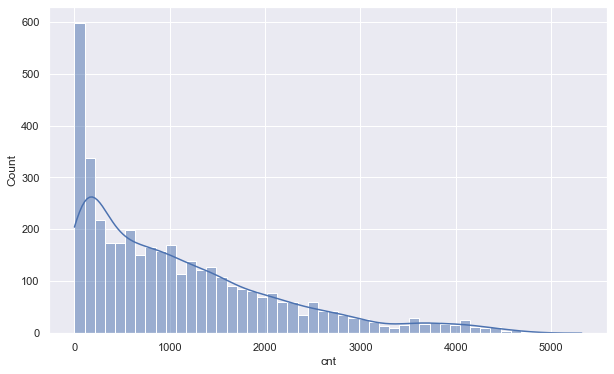

In [71]:
sns.histplot(x='cnt', data=s1, kde=True, bins=50)
plt.show()

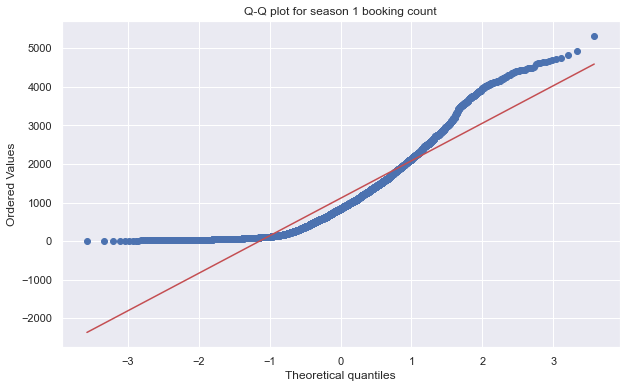

In [72]:
stats.probplot(s1['cnt'], plot= plt, dist="norm")
plt.title('Q-Q plot for season 1 booking count')
plt.show()

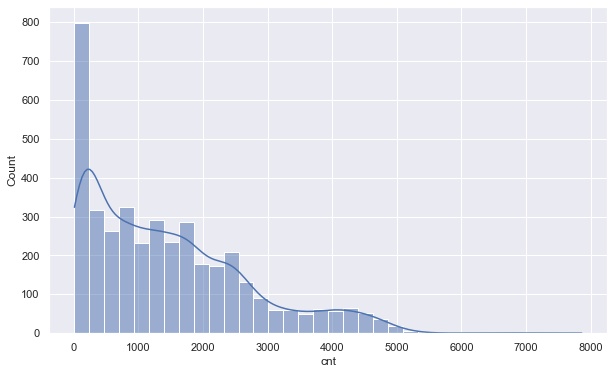

In [73]:
sns.histplot(x='cnt', data=s2, kde=True)
plt.show()

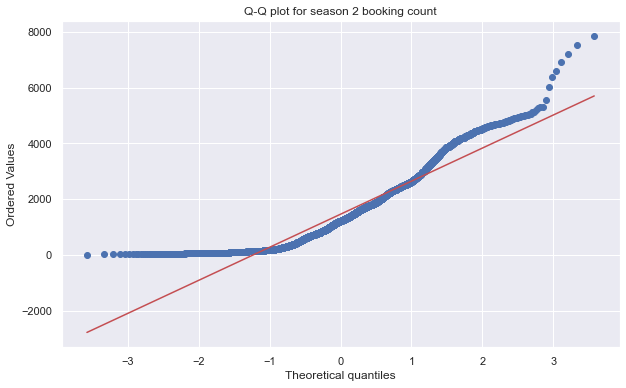

In [74]:
stats.probplot(s2['cnt'], plot= plt, dist="norm")
plt.title('Q-Q plot for season 2 booking count')
plt.show()

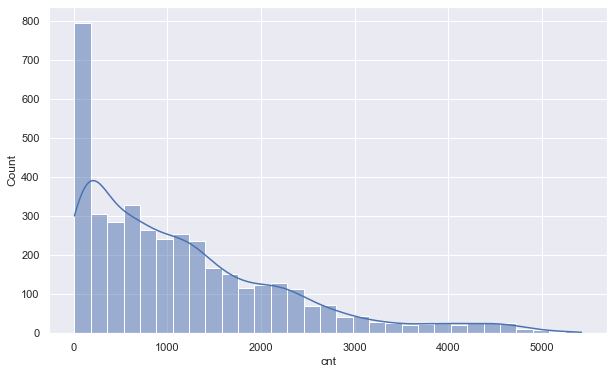

In [75]:
sns.histplot(x='cnt', data=s3, kde=True)
plt.show()

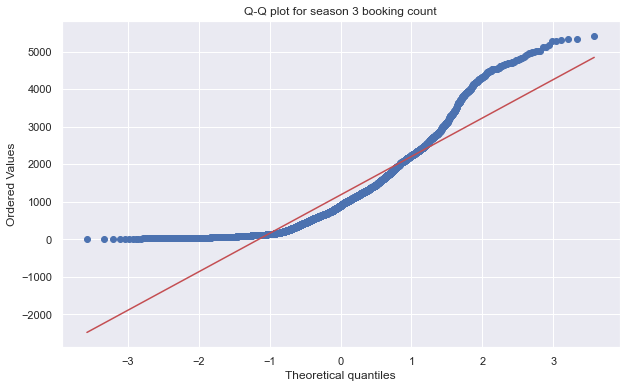

In [76]:
stats.probplot(s3['cnt'], plot= plt, dist="norm")
plt.title('Q-Q plot for season 3 booking count')
plt.show()

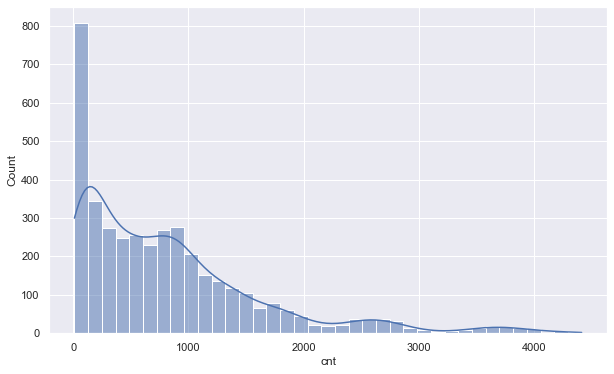

In [77]:
sns.histplot(x='cnt', data=s4, kde=True)
plt.show()

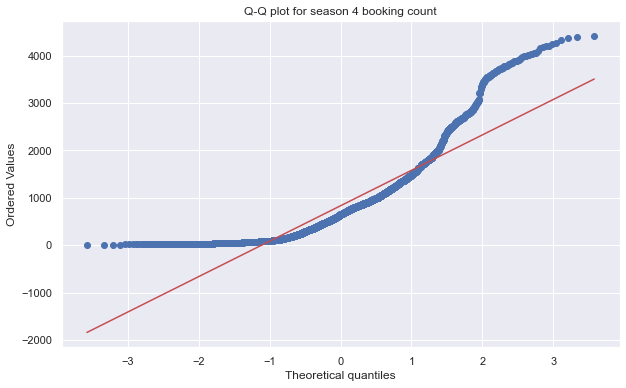

In [78]:
stats.probplot(s4['cnt'], plot= plt, dist="norm")
plt.title('Q-Q plot for season 4 booking count')
plt.show()